In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

import matplotlib.pyplot as plt
%matplotlib inline
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
import seaborn as sns

In [2]:
with open('EastWestAirlines.xlsx') as f:
    print(f)

<_io.TextIOWrapper name='EastWestAirlines.xlsx' mode='r' encoding='cp1252'>


In [3]:
df = pd.read_csv('EastWestAirlines.csv')
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
5,6,16420,0,1,1,1,0,0,0,0,6942,0
6,7,84914,0,3,1,1,27482,25,0,0,6994,0
7,8,20856,0,1,1,1,5250,4,250,1,6938,1
8,9,443003,0,3,2,1,1753,43,3850,12,6948,1
9,10,104860,0,3,1,1,28426,28,1150,3,6931,1


Since I was facing issue with Excel file (data incomeplete and changed) so I saved file as csv file first

In [4]:
data = pd.read_csv('EastWestAirlines.csv', usecols= ['Balance','Qual_miles','cc1_miles','cc2_miles','cc3_miles','Bonus_miles','Bonus_trans','Flight_miles_12mo','Flight_trans_12','Days_since_enroll','Award?'])
data

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
5,16420,0,1,1,1,0,0,0,0,6942,0
6,84914,0,3,1,1,27482,25,0,0,6994,0
7,20856,0,1,1,1,5250,4,250,1,6938,1
8,443003,0,3,2,1,1753,43,3850,12,6948,1
9,104860,0,3,1,1,28426,28,1150,3,6931,1


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 343.8 KB


In [6]:
data.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [7]:
data.rename(columns = {'Award?':'Award'}, inplace = True)

In [8]:
data

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
5,16420,0,1,1,1,0,0,0,0,6942,0
6,84914,0,3,1,1,27482,25,0,0,6994,0
7,20856,0,1,1,1,5250,4,250,1,6938,1
8,443003,0,3,2,1,1753,43,3850,12,6948,1
9,104860,0,3,1,1,28426,28,1150,3,6931,1


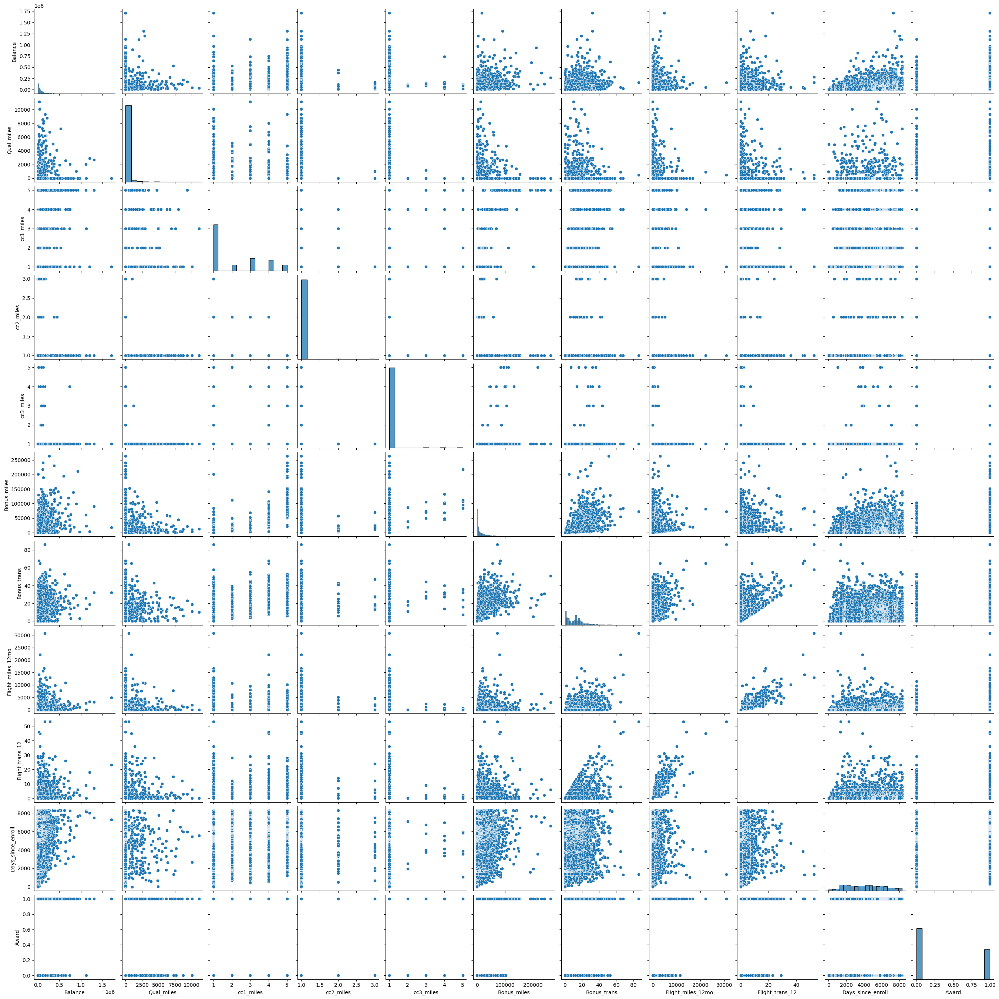

In [25]:
sns.pairplot(data)

In [9]:
def norm_func(i):
    x = (i-i.min())/(i.max()-i.min())
    return x

In [10]:
df_norm = norm_func(df.iloc[:,1:])

In [11]:
df_norm

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.016508,0.000000,0.00,0.0,0.00,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.000000,0.00,0.0,0.00,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.000000,0.00,0.0,0.00,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.000000,0.00,0.0,0.00,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.000000,0.75,0.0,0.00,0.164211,0.302326,0.067398,0.075472,0.835905,1.0
5,0.009631,0.000000,0.00,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.836749,0.0
6,0.049808,0.000000,0.50,0.0,0.00,0.104223,0.290698,0.000000,0.000000,0.843019,0.0
7,0.012233,0.000000,0.00,0.0,0.00,0.019910,0.046512,0.008112,0.018868,0.836267,1.0
8,0.259850,0.000000,0.50,0.5,0.00,0.006648,0.500000,0.124931,0.226415,0.837473,1.0
9,0.061507,0.000000,0.50,0.0,0.00,0.107803,0.325581,0.037317,0.056604,0.835423,1.0


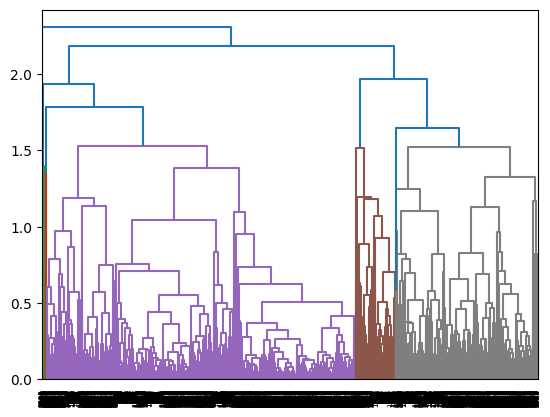

In [12]:
dendrogram = sch.dendrogram(sch.linkage(df_norm, method='complete'))

In [13]:
# create clusters
hc = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'complete')

In [14]:
hc.fit(df_norm)

C:\Users\shlok\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=3)

In [15]:
# save clusters for chart
y_hc = hc.fit_predict(df_norm)
# Clusters=pd.DataFrame(y_hc,columns=['Clusters'])

C:\Users\shlok\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [16]:
Clusters=pd.DataFrame(y_hc,columns=['Clusters'])

In [17]:
Clusters

,Clusters
0,2
1,2
2,2
3,2
4,0
5,2
6,2
7,0
8,0
9,0


In [18]:
Clusters.value_counts()

Clusters
2           2526
0           1469
1              4
dtype: int64

In [19]:
y_hc

array([2, 2, 2, ..., 0, 2, 2], dtype=int64)

In [20]:
df['h_clusterdid'] = y_hc

In [21]:
df.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,h_clusterdid
0,1,28143,0,1,1,1,174,1,0,0,7000,0,2
1,2,19244,0,1,1,1,215,2,0,0,6968,0,2
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,2
3,4,14776,0,1,1,1,500,1,0,0,6952,0,2
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,0


In [22]:
df = df.sort_values('h_clusterdid')
df.iloc[:,[0,-1]]

,ID#,h_clusterdid
1999,2016,0
3162,3184,0
3165,3187,0
3167,3189,0
1505,1520,0
3168,3190,0
1503,1518,0
3169,3191,0
1501,1516,0
1500,1515,0


In [23]:
df_norm_1 = norm_func(df.iloc[:,1:])
# create clusters
hc_1 = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'complete')

hc_1.fit(df_norm_1)

y_hc_1 = hc.fit_predict(df_norm_1)

y_hc_1

df['h_clusterid'] = y_hc_1

df.head()

df=df.sort_values("h_clusterid")
new=df.iloc[:,[0,-1]]

C:\Users\shlok\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\Users\shlok\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [24]:
new

,ID#,h_clusterid
1999,2016,0
3755,3778,0
471,477,0
472,478,0
3754,3777,0
3753,3776,0
3752,3775,0
3751,3774,0
478,484,0
469,475,0
